# 1D linearized shallow-water equation with wind stress

The one-dimensional shallow-water equations can be simplified to a 1D wave-equation with wind forcing:

$\partial h/\partial t + \partial Hu / \partial x = 0$

$\partial u/\partial t + g \partial h / \partial x = \tau/(\rho H) -(\rho g u|u|)/(H C^2)$

where $h$ denotes the water-height above the reference, $u$ the velocity, $D$ the depth below the reference, $H=D+h$ the total water depth and $t,x$ time and space. In the quadratic friction term $C$ denotes the Chezy friction coefficient.

At the left boundary $q_{left}$ denotes the inflow and $q_{right}$ the outflow at the right boundary, i.e. the sign is aligned with $u$.

$u(x=0,t)=q_{left}(t)/(H W)$

$u(x=L,t)=q_{right}(t)/(H W)$

The equations and approach are similar to the model_1d_wave_periodic.jl 
model. Here the equations are not fully linear, on a 'closed' domain,
and with a wind-stress forcing term.


In [1]:
# goto folder of this notebook (If you move this notebook then also copy the Project.toml file and run instantiate to install the packages)
cd(@__DIR__)

# load the environment
using Pkg; Pkg.activate(".")  
#Pkg.instantiate()

# load the packages
using OrdinaryDiffEq, ComponentArrays, Plots, JLD2


  Activating project at `~/Desktop/Deltares/Final Report Code/Model-2`


In [2]:
# Load model definition
include(joinpath(@__DIR__, "model_1d_surge_wave.jl"))

Wave1DSurge_cpu

In [3]:
# setting up the problem

# parameters 
nx = 200       # number of spatial points
L = 100.0e3    # length of the domain
dx = L / nx    # spatial step

rho = 1000.0   # density of water
g = 10.0       # acceleration due to gravity

grid_u = collect(0.0:dx:L)             # grid for velocity
grid_h = collect(dx/2:dx:(L - dx/2))   # grid for water levels

D_min = 10.0   # minimum depth of the water
D_max = 30.0   # maximum depth of the water
D_edges = [0.3, 0.7] .* L       # edges of the depth change
D_widths = [0.05, 0.05] .* L    # widths of the depth change
D = depth_profile(grid_u, D_min, D_max, D_edges, D_widths)

W = 100.0 # width
C = 60.0 # Chezy friction factor

# wind stress as a function of time
# wind stress forcing
function tau_func(t, a=1.0, T=3600.0)
    return (a * sin(2 * π * t / T))^2
end
tau(t) = tau_func(t, 1.0, 8 * 3600.0) # set parameters

function constant_func(t, value=0.0)
    return value
end

q_left(t) = constant_func(t, 0.0)
q_right(t) = constant_func(t, 0.0) # Note q_left - q_right is the net influx

# initial state
f = Wave1DSurge_cpu(g, D, L, W, dx, nx, rho, C, tau, q_left, q_right)
x0 = initial_state_bump(f, 0.25, 0.05, 0.3, 0.0) # h bump
#x0 = initial_state_bump(f, 0.0, 0.05, 0.3, 0.1) # u bump


# time span
t_start = 0.0
t_end = 6 * 3600.0 # hours

# spatial grid 
x_h = grid_h
x_u = grid_u
x = ComponentVector(h = x_h, u = x_u)
nothing

In [4]:
# test steps of the pde model
h_avg = similar(x0.u)
avg_h!(h_avg, x0.h, dx)
#@show h_avg[1:10:end]'

H = h_avg .+ D
#@show H[1:10:end]'

Hu = H .* x0.u
@show x0.u[1:10:end]'
@show Hu[1:10:end]'

(x0.u[1:10:end])' = adjoint([0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0])
(Hu[1:10:end])' = adjoint([0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0])


1×21 adjoint(::Vector{Float64}) with eltype Float64:
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  …  0.0  0.0  0.0  0.0  0.0  0.0  0.0

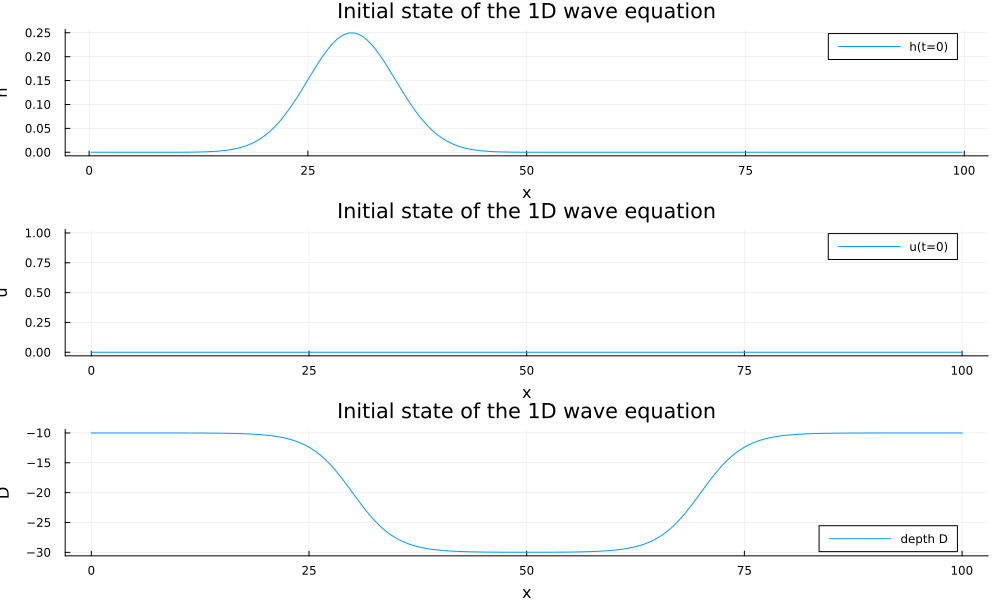

In [5]:
# plot the initial state
p1 = plot(1e-3 * x_h, x0.h, label="h(t=0)", xlabel="x", ylabel="h")
p2 = plot(1e-3 * x_u, x0.u, label="u(t=0)", xlabel="x", ylabel="u")
p3 = plot(1e-3 * x_u, -D, label="depth D", xlabel="x", ylabel="D")
plot(p1, p2, p3, layout=(3, 1), size=(1000, 600), title="Initial state of the 1D wave equation")

size(dx_dt.h) = (200,)
size(dx_dt.u) = (201,)


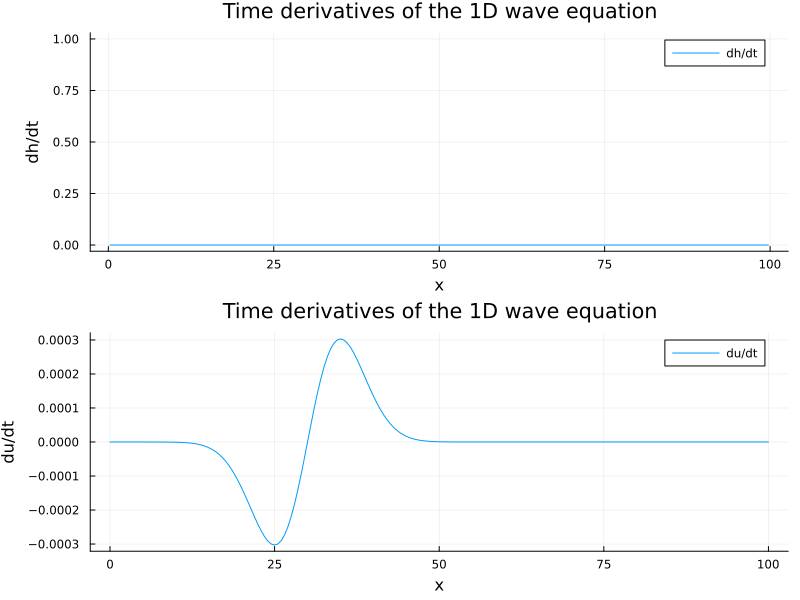

In [6]:
# check model components 
dx_dt = similar(x0)
f(dx_dt, x0, f, t_start)

@show size(dx_dt.h)
@show size(dx_dt.u)

p1 = plot(1e-3 * x_h, dx_dt.h, label="dh/dt", xlabel="x", ylabel="dh/dt")
p2 = plot(1e-3 * x_u, dx_dt.u, label="du/dt", xlabel="x", ylabel="du/dt")
plot(p1, p2, layout=(2, 1), size=(800, 600), title="Time derivatives of the 1D wave equation")

In [7]:
prob = ODEProblem(f, x0, (t_start, t_end))
@time sol = solve(prob, Tsit5(),saveat=10.0) # with timing, but ouput only at t=10.0
sol = solve(prob, Tsit5()) # store output, no timing
sol2 = solve(prob, KenCarp4(), reltol=1e-6, abstol=1e-8)
sol3 = solve(prob, TRBDF2(), reltol=1e-6, abstol=1e-8)

nothing

  1.140716 seconds (8.59 M allocations: 487.365 MiB, 6.02% gc time, 97.95% compilation time)


In [8]:
@show size(sol)
@show size(sol2)
@show size(sol3)

size(sol) = (401, 1033)
size(sol2) = (401, 975)
size(sol3) = (401, 7152)


(401, 7152)

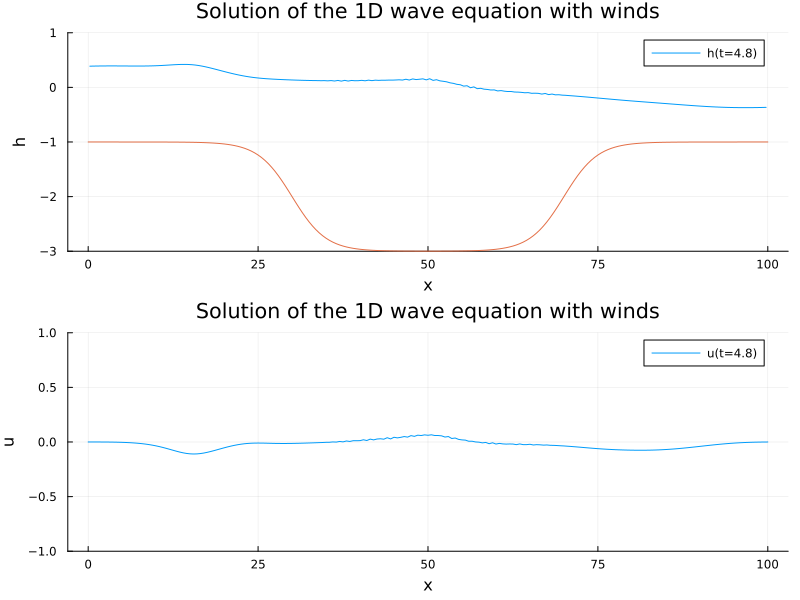

In [9]:
i = 800
p1 = plot(1e-3 * x_h, sol[i].h, label="h(t=$(round(sol.t[i]/3600, digits=1)))", xlabel="x", ylabel="h", ylim=(-3, 1))
plot!(p1, 1e-3 * x_u, -0.1 * f.D, label=false)
p2 = plot(1e-3 * x_u, sol[i].u, label="u(t=$(round(sol.t[i]/3600, digits=1)))", xlabel="x", ylabel="u", ylim=(-1, 1))
plot(p1, p2, layout=(2,1), size=(800,600), title="Solution of the 1D wave equation with winds")

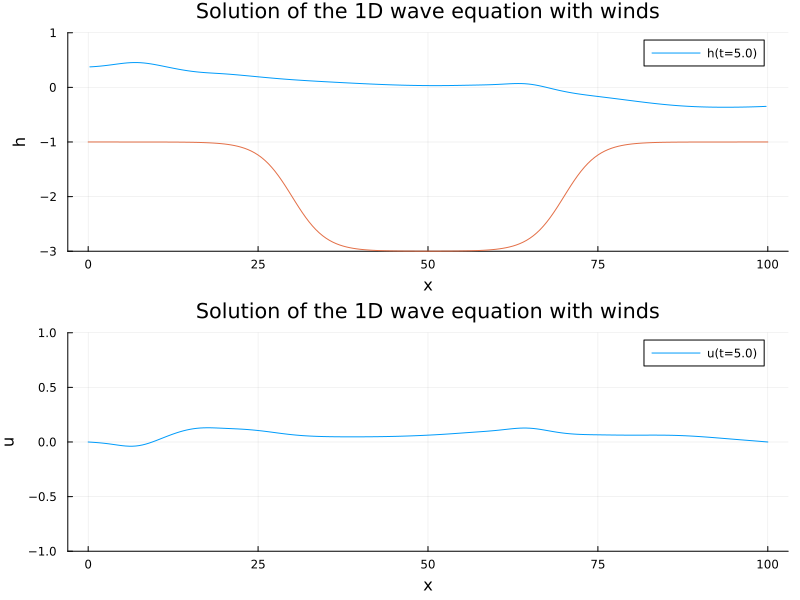

In [10]:
i = 800
p1 = plot(1e-3 * x_h, sol2[i].h, label="h(t=$(round(sol2.t[i]/3600, digits=1)))", xlabel="x", ylabel="h", ylim=(-3, 1))
plot!(p1, 1e-3 * x_u, -0.1 * f.D, label=false)
p2 = plot(1e-3 * x_u, sol2[i].u, label="u(t=$(round(sol2.t[i]/3600, digits=1)))", xlabel="x", ylabel="u", ylim=(-1, 1))
plot(p1, p2, layout=(2,1), size=(800,600), title="Solution of the 1D wave equation with winds")

┌ Info: Saved animation to /Users/sara/Desktop/Deltares/Final Report Code/Model-2/wave1d_surge.gif
└ @ Plots /Users/sara/.julia/packages/Plots/ywg93/src/animation.jl:156


 41.242692 seconds (27.63 M allocations: 1.199 GiB, 0.89% gc time, 0.85% compilation time: 20% of which was recompilation)


Plots.AnimatedGif("/Users/sara/Desktop/Deltares/Final Report Code/Model-2/wave1d_surge.gif")
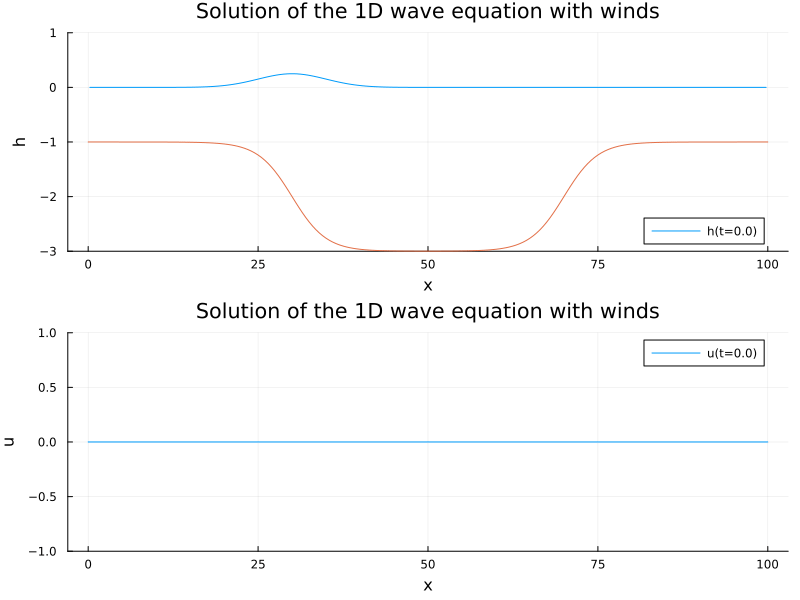

In [11]:
# create a movie of the solution
@time begin
    # create a movie of the solution
    anim = @animate for i in 1:length(sol.t)
        p1 = plot(1e-3 * x_h, sol[i].h, label="h(t=$(round(sol.t[i]/3600, digits=1)))", xlabel="x", ylabel="h", ylim=(-3, 1))
        plot!(p1, 1e-3 * x_u, -0.1 * f.D, label=false) #depth with false scaling

        p2 = plot(1e-3 * x_u, sol[i].u, label="u(t=$(round(sol.t[i]/3600, digits=1)))", xlabel="x", ylabel="u", ylim=(-1, 1))
        plot(p1, p2, layout=(2,1), size=(800,600), title="Solution of the 1D wave equation with winds")
    end
    gif(anim, "wave1d_surge.gif", fps=30)
end


  9.225585 seconds (9.21 M allocations: 345.288 MiB, 1.35% gc time, 1.45% compilation time)


┌ Info: Saved animation to /Users/sara/Desktop/Deltares/Final Report Code/Model-2/combined_solutions.gif
└ @ Plots /Users/sara/.julia/packages/Plots/ywg93/src/animation.jl:156


Plots.AnimatedGif("/Users/sara/Desktop/Deltares/Final Report Code/Model-2/combined_solutions.gif")
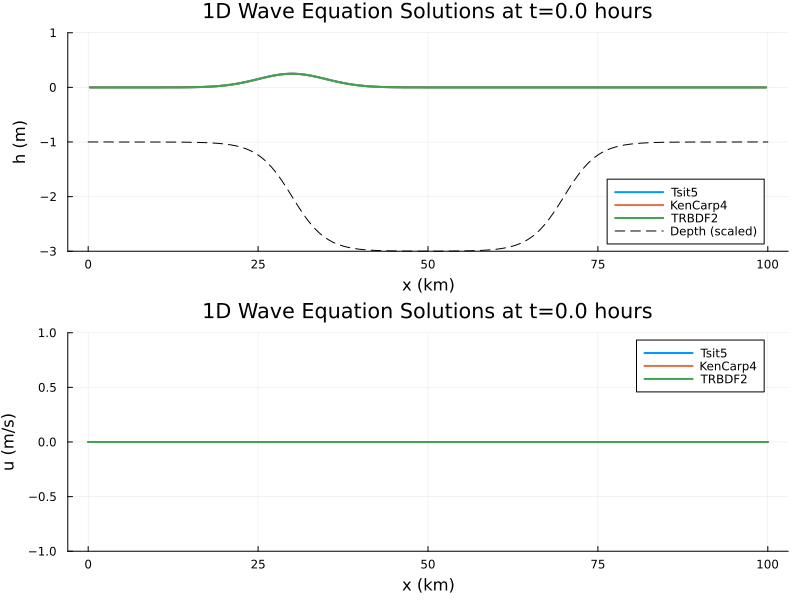

In [12]:
# Create common time points for comparison
common_times = range(t_start, t_end, length=200)  # 200 evenly spaced time points

@time begin
    anim = @animate for t in common_times
        p1 = plot(1e-3 * x_h, sol(t).h, label="Tsit5", linewidth=2, xlabel="x (km)", ylabel="h (m)", ylim=(-3, 1))
        plot!(p1, 1e-3 * x_h, sol2(t).h, label="KenCarp4", linewidth=2)
        plot!(p1, 1e-3 * x_h, sol3(t).h, label="TRBDF2", linewidth=2)
        plot!(p1, 1e-3 * x_u, -0.1 * f.D, label="Depth (scaled)", linestyle=:dash, color=:black)
        
        p2 = plot(1e-3 * x_u, sol(t).u, label="Tsit5", linewidth=2, xlabel="x (km)", ylabel="u (m/s)", ylim=(-1, 1))
        plot!(p2, 1e-3 * x_u, sol2(t).u, label="KenCarp4", linewidth=2)
        plot!(p2, 1e-3 * x_u, sol3(t).u, label="TRBDF2", linewidth=2)
        
        plot(p1, p2, layout=(2,1), size=(800,600), title="1D Wave Equation Solutions at t=$(round(t/3600, digits=2)) hours")
    end
    gif(anim, "combined_solutions.gif", fps=20)
end

 45.408589 seconds (45.80 M allocations: 1.655 GiB, 0.62% gc time)


┌ Info: Saved animation to /Users/sara/Desktop/Deltares/Final Report Code/Model-2/combined_solutions_interpolated.gif
└ @ Plots /Users/sara/.julia/packages/Plots/ywg93/src/animation.jl:156


Plots.AnimatedGif("/Users/sara/Desktop/Deltares/Final Report Code/Model-2/combined_solutions_interpolated.gif")
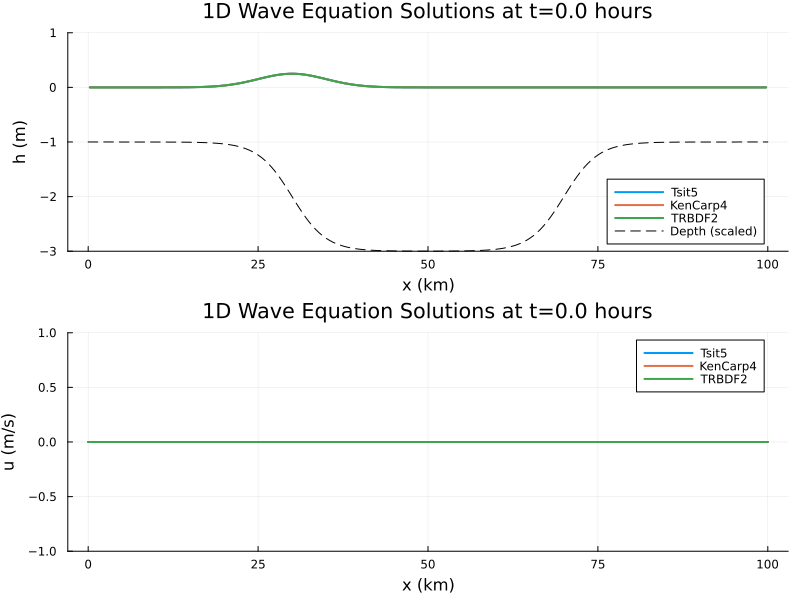

In [13]:
# Use sol's time points (since it has a moderate number of points)
@time begin
    anim = @animate for i in 1:length(sol.t)
        t = sol.t[i]
        p1 = plot(1e-3 * x_h, sol[i].h, label="Tsit5", linewidth=2, xlabel="x (km)", ylabel="h (m)", ylim=(-3, 1))
        plot!(p1, 1e-3 * x_h, sol2(t).h, label="KenCarp4", linewidth=2)  # Interpolate sol2
        plot!(p1, 1e-3 * x_h, sol3(t).h, label="TRBDF2", linewidth=2)    # Interpolate sol3
        plot!(p1, 1e-3 * x_u, -0.1 * f.D, label="Depth (scaled)", linestyle=:dash, color=:black)
        
        p2 = plot(1e-3 * x_u, sol[i].u, label="Tsit5", linewidth=2, xlabel="x (km)", ylabel="u (m/s)", ylim=(-1, 1))
        plot!(p2, 1e-3 * x_u, sol2(t).u, label="KenCarp4", linewidth=2)
        plot!(p2, 1e-3 * x_u, sol3(t).u, label="TRBDF2", linewidth=2)
        
        plot(p1, p2, layout=(2,1), size=(800,600), title="1D Wave Equation Solutions at t=$(round(t/3600, digits=2)) hours")
    end
    gif(anim, "combined_solutions_interpolated.gif", fps=20)
end

In [14]:
# save the solution to a JLD2 file
cfl_out = 1.0 # CFL number for output
dt_out_auto = cfl_out * f.dx / (sqrt(maximum(f.D) * f.g)) # time step for output, based on CFL condition
println("time-step with CFL=1 is $(dt_out_auto)")
dt_out = 60.0 #manual value
times = collect(0.0:dt_out:t_end) # output times
solution = []
for t in times
    h_value = sol(t).h
    u_value = sol(t).u
    tau_value = f.tau(t)
    q_left_value = f.q_left(t)
    q_right_value = f.q_right(t)
    x = ComponentVector(h=h_value, u=u_value, tau=tau_value, q_left=q_left_value, q_right=q_right_value)
    push!(solution, sol(t))
end
# save the solution to a JLD2 file
save("wave1d_surge.jld2", 
    "solution", solution,
    "times", times,
    "params", (g=f.g, C=f.C, rho=f.rho, W=f.W, D=f.D, L=f.L, dx=f.dx, nx=f.nx),
    "grid", x,
    "cfl_out", cfl_out,
    "dt_out", dt_out,
    "description", "Solution of the 1D shallow water equation with wind stress.")


time-step with CFL=1 is 28.873969440846086


In [15]:
# load the solution from the JLD2 file for testing
ff = load("wave1d_surge.jld2")
@show ff["solution"][1].h[1:20:end] # show some values of the initial height field
#display(ff["solution"])
nothing

((ff["solution"])[1]).h[1:20:end] = [5.133160112307913e-9, 0.00010230578255704472, 0.037345443812604504, 0.24968769523114523, 0.030575863336725153, 6.85776168733503e-5, 2.8171379995683083e-9, 2.1196098395331503e-15, 2.920961309676245e-23, 7.372550472133255e-33]
